# AdaBins Verify

In [1]:
# Initialization
%load_ext autoreload
%autoreload 2

# Basic imports for file manipulation
import sys
import os
import time
import copy
import pickle
import glob
# Matrix manipulation library
import numpy as np
# Pytorch Libraries
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms.functional as F
import torch.utils.data


# Standard python random library
import random

# Computer vision libraries for image manipulation
import cv2 as cv 
from PIL import Image
import seaborn as sns

# The following are to do with interactive notebook code
%matplotlib inline 
import matplotlib
from matplotlib import pyplot as plt # this lets you draw inline pictures in the notebooks
import matplotlib.patches as mpatches
import pylab # this allows you to control figure size 
pylab.rcParams['figure.figsize'] = (10.0, 8.0) # this controls figure size in the notebook

print(f"OpenCV Version: {cv.__version__}")
plt.ion()   # interactive mode

dtype = torch.float
ltype = torch.long
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')

print('Torch using device:', device)


OpenCV Version: 4.5.5
Torch using device: cuda:0


In [2]:
def insert_to_path_if_necessary(path):
    if path not in sys.path:
        sys.path.insert(0, os.path.abspath(path))
        print("Updated Python Path")

In [3]:
verify_root_path = os.path.abspath('/cs6945share/manual_dashcam')

print("Verify root path: {0}".format(verify_root_path))

Verify root path: /cs6945share/manual_dashcam


# AdaBins Physical Verification
Using AdaBins:
- https://arxiv.org/abs/2011.14141
- https://github.com/shariqfarooq123/AdaBins

In [4]:
adabins_src_root = '../kitti_viz_src/AdaBins'
insert_to_path_if_necessary(adabins_src_root)
from infer import InferenceHelper

Updated Python Path


In [5]:
video_dir_path = os.path.join(verify_root_path, 'data/hd_pro_arad/')
vid_filenames = ['GH014309.MP4', 'GH014310.MP4']
low_res_vid_filenames = ['GL014309.MP4', 'GL014310.MP4']
vid_paths = [os.path.join(video_dir_path, name) for name in vid_filenames]
print(vid_paths)
low_res_vid_paths = [os.path.join(video_dir_path, name) for name in low_res_vid_filenames]
print(low_res_vid_paths)

['/cs6945share/manual_dashcam/data/hd_pro_arad/GH014309.MP4', '/cs6945share/manual_dashcam/data/hd_pro_arad/GH014310.MP4']
['/cs6945share/manual_dashcam/data/hd_pro_arad/GL014309.MP4', '/cs6945share/manual_dashcam/data/hd_pro_arad/GL014310.MP4']


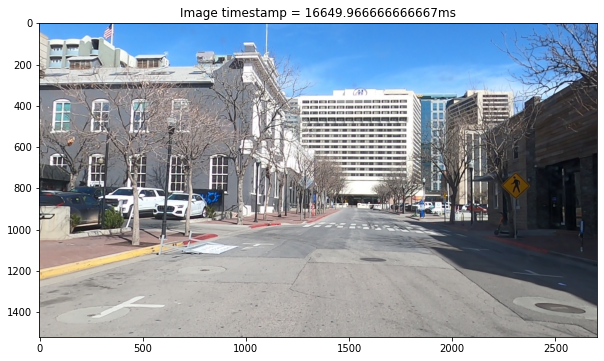

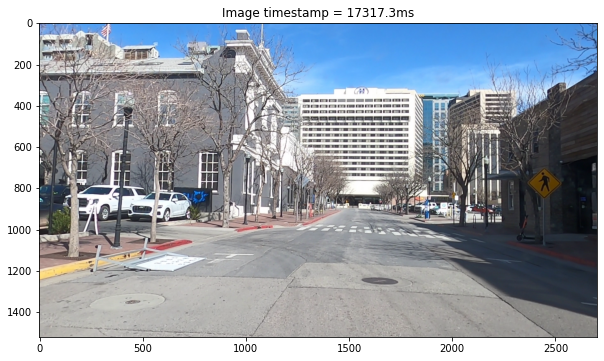

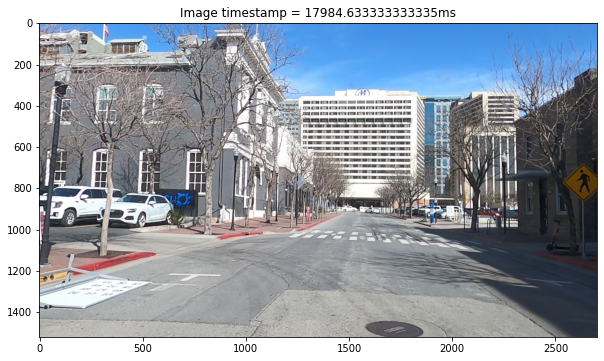

In [6]:
def extract_images_from_video(vid_path, vid_extract_start_ms, vid_extract_end_ms, skip_num=1, preview=True, preview_and_save=False):
    extracted_image_list = []
    vid = cv.VideoCapture(vid_path)
    i = 0
    while vid.isOpened():
        image_exists, image = vid.read()
        current_ms = vid.get(cv.CAP_PROP_POS_MSEC)
        if (current_ms < vid_extract_start_ms):
            continue
        if (current_ms > vid_extract_end_ms):
            break
        if not image_exists:
            continue
        i += 1
        if i != skip_num:
            continue
        i = 0
        image_color_conv = cv.cvtColor(image, cv.COLOR_BGR2RGB)
        extracted_image_list.append(image_color_conv)
        if preview:
            plt.figure()
            plt.title('Image timestamp = {0}ms'.format(current_ms))
            plt.imshow(image_color_conv)
            if preview_and_save:
                save_path = os.path.join(os.getcwd(),'img_{0}.png'.format(current_ms))
                cv.imwrite(save_path, image)
                print('Saved image to {0}'.format(save_path))
            plt.show()
    vid.release()
    return extracted_image_list

vid_images = extract_images_from_video(vid_paths[0], 16*1000, 18.5*1000, skip_num=20, preview=True, preview_and_save=False)

## Physical Dimensions of Whiteboard
Wheel base of whiteboard is 74.75 inches or 1.89865 meters

Note: 
Adabins input sizes must be 1241 x 376 (kitti size) or 640 x 480 (NYU size)
(https://github.com/shariqfarooq123/AdaBins/issues/5)

Loading base model ()...

Downloading: "https://github.com/rwightman/gen-efficientnet-pytorch/archive/master.zip" to /home/default/.cache/torch/hub/master.zip
Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b5_ap-9e82fae8.pth" to /home/default/.cache/torch/hub/checkpoints/tf_efficientnet_b5_ap-9e82fae8.pth


Done.
Removing last two layers (global_pool & classifier).
Building Encoder-Decoder model..Done.


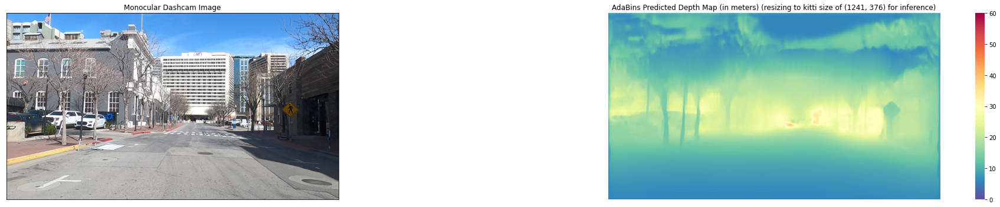

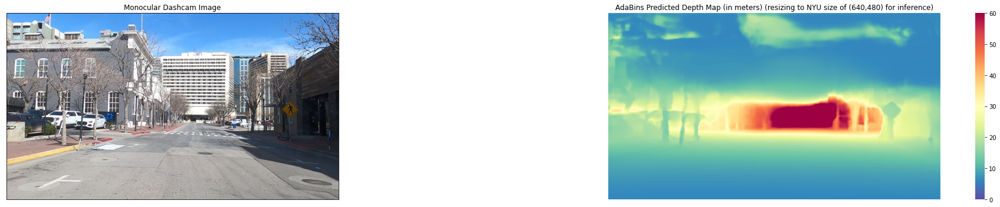

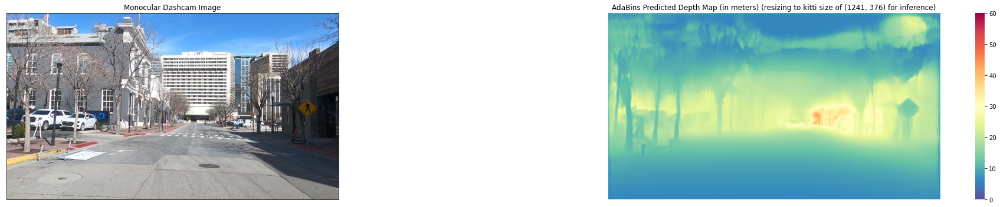

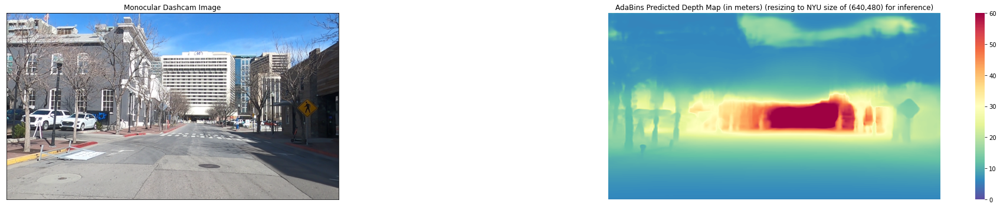

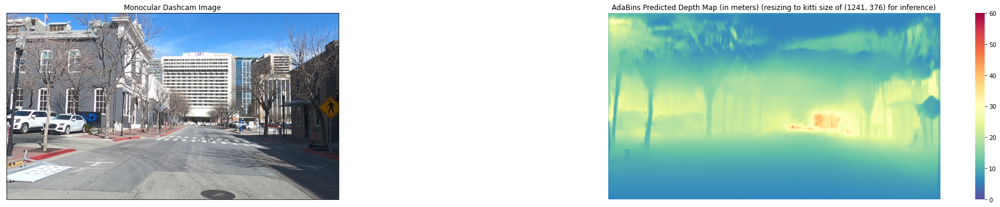

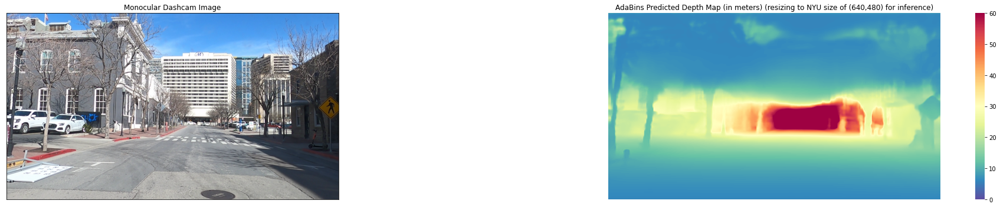

In [7]:
def adabins_predict_pil_anysize(infer_helper, pil_image, prediction_dimensions):
    original_size = pil_image.size
    pil_image_resize = pil_image.resize(prediction_dimensions)
    bin_centers, predicted_depth = infer_helper.predict_pil(pil_image_resize)
    d_map_pred = predicted_depth[0][0]
    d_map_pred_upsample = Image.fromarray(d_map_pred).resize(original_size) # Performs bicubic interpolation
    return d_map_pred_upsample

def adabins_predict_and_viz(pil_image, dmap_pred, extra_plotting_func=None, cbar_min=None, cbar_max=None):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30,5))

    ax1.imshow(pil_image)
    ax1.set_title('Monocular Dashcam Image')

    sns.heatmap(d_map_pred, cmap=sns.color_palette("Spectral_r", as_cmap=True), square=True, ax=ax2, vmin=cbar_min, vmax=cbar_max)
    ax2.set_title('AdaBins Predicted Depth Map (in meters)')
    
    if extra_plotting_func is not None:
        extra_plotting_func(fig, ax1, ax2)
    
    ax1.set_yticks([],[])
    ax1.set_xticks([],[])
    ax2.set_yticks([],[])
    ax2.set_xticks([],[])
    fig.tight_layout()
    fig.show()
    plt.show()
    

prev_dir = os.getcwd()
try:
    os.chdir(adabins_src_root)
    infer_helper = InferenceHelper(dataset='kitti') # dataset='kitti' sets some parameters for training and things like min depth, max depth, and saving factor, only matters for inference so values beyond 10 meters can be predicted
    
    for vid_image in vid_images:
        pil_img = Image.fromarray(vid_image)
        
        d_map_pred = adabins_predict_pil_anysize(infer_helper, pil_img, (1241, 376))
        adabins_predict_and_viz(pil_img, d_map_pred, extra_plotting_func=lambda fig, ax1, ax2:ax2.set_title('AdaBins Predicted Depth Map (in meters) (resizing to kitti size of (1241, 376) for inference)'), cbar_min=0, cbar_max=60)
        
        d_map_pred = adabins_predict_pil_anysize(infer_helper, pil_img, (640,480))            
        adabins_predict_and_viz(pil_img, d_map_pred, extra_plotting_func=lambda fig, ax1, ax2:ax2.set_title('AdaBins Predicted Depth Map (in meters) (resizing to NYU size of (640,480) for inference)'), cbar_min=0, cbar_max=60)

finally:
    os.chdir(prev_dir)
    

## Points of interest

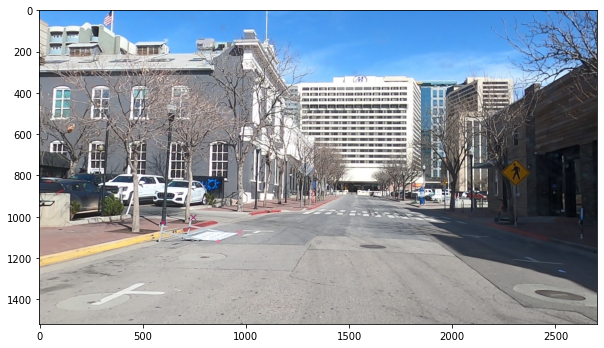

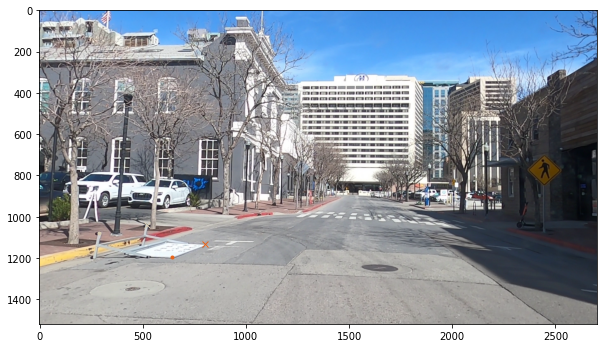

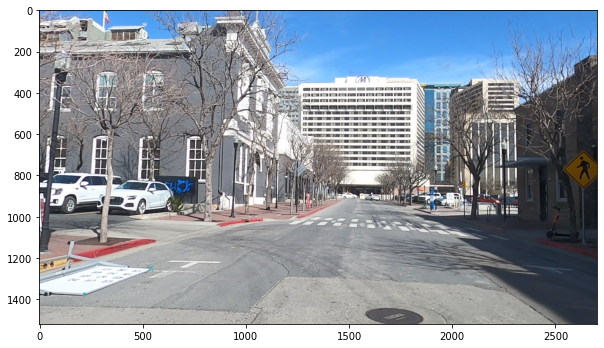

In [8]:
def plot_p1_p2_collection(vid_image, p1_collection, p2_collection):
    plt.figure()
    plt.imshow(vid_image)
    for p1,p2 in zip(p1_collection, p2_collection):
        color = np.random.rand(3,)
        plt.plot(p1[0], p1[1], c=color, marker='.')
        plt.plot(p2[0], p2[1], c=color, marker='x')
    plt.show()

points_of_interest = []
# Relative distances (each of these pairs corresponds to approximately 1.9m)

# Image 0
p1_collection = np.array([[598, 1024], [865, 1120]]) # Denoted as .
p2_collection = np.array([[742, 1003], [965, 1073]]) # Denoted as x
points_of_interest.append((p1_collection, p2_collection))
plot_p1_p2_collection(vid_images[0], p1_collection, p2_collection)


# Image 1
p1_collection = np.array([[290, 1080], [641, 1198]]) # Denoted as .
p2_collection = np.array([[520, 1039], [800, 1133]]) # Denoted as x
points_of_interest.append((p1_collection, p2_collection))
plot_p1_p2_collection(vid_images[1], p1_collection, p2_collection)

# Image 2
p1_collection = np.array([[215, 1377]]) # Denoted as .
p2_collection = np.array([[537, 1251]]) # Denoted as x
points_of_interest.append((p1_collection, p2_collection))
plot_p1_p2_collection(vid_images[2], p1_collection, p2_collection)


Loading base model ()...

Using cache found in /home/default/.cache/torch/hub/rwightman_gen-efficientnet-pytorch_master


Done.
Removing last two layers (global_pool & classifier).
Building Encoder-Decoder model..Done.


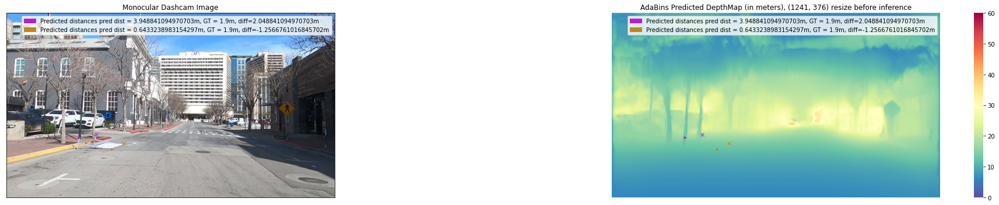

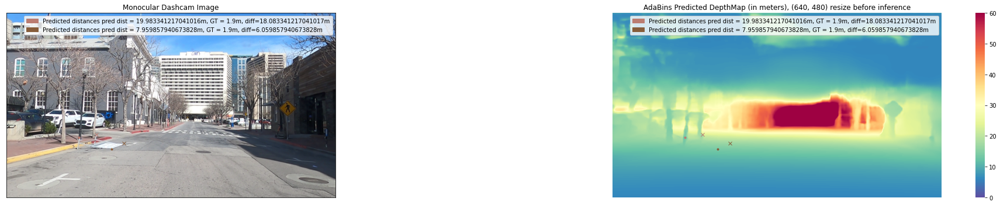

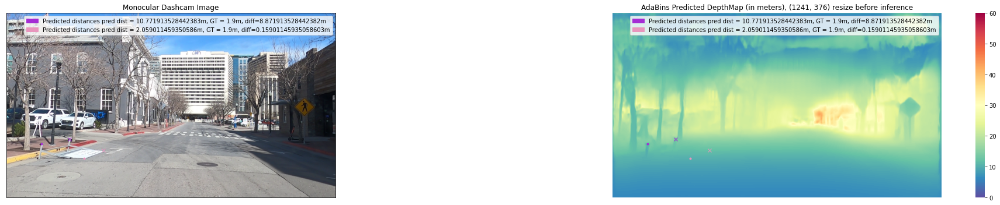

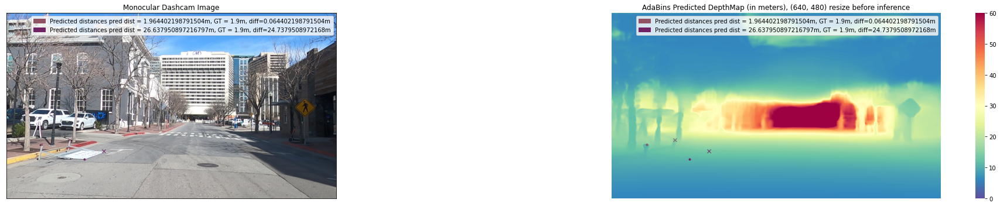

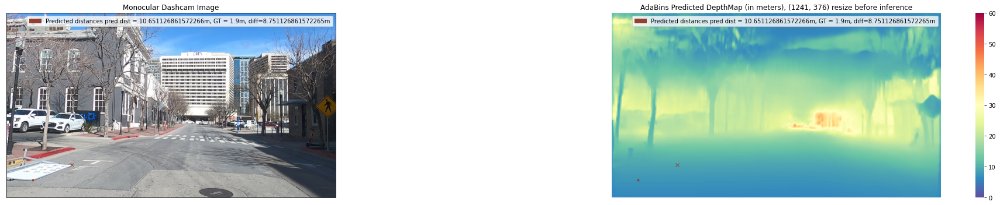

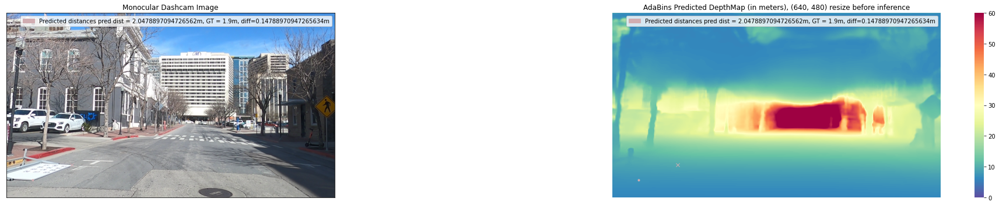

In [9]:
def plotting_points_of_interest(fig, ax1, ax2, p1_collection, p2_collection, evaluation_results, ax1_title_text=None, ax2_title_text=None):
    legend_list = []
    for i,(p1,p2) in enumerate(zip(p1_collection, p2_collection)):
        predicted_distances, ground_truth, difference = evaluation_results
        color = np.random.rand(3,)
        ax1.plot(p1[0], p1[1], c=color, marker='.')
        ax1.plot(p2[0], p2[1], c=color, marker='x')
        ax2.plot(p1[0], p1[1], c=color, marker='.')
        ax2.plot(p2[0], p2[1], c=color, marker='x')
        patch = mpatches.Patch(color=color, label='Predicted distances pred dist = {0}m, GT = {1}m, diff={2}m'.format(predicted_distances[i], ground_truth[i], difference[i]))
        legend_list.append(patch)
    ax1.legend(handles=legend_list)
    ax2.legend(handles=legend_list)
    if ax1_title_text is not None:
        ax1.set_title(ax1_title_text)
    if ax2_title_text is not None:
        ax2.set_title(ax2_title_text)

def evalaute_against_ground_truth(dmap, ground_truth, p1_collection, p2_collection):
    dmap_array = np.array(dmap)
    predicted_distances = []
    for i,(p1,p2) in enumerate(zip(p1_collection, p2_collection)):
        predicted_distance = np.abs(dmap_array[tuple(p2)] - dmap_array[tuple(p1)])
        predicted_distances.append(predicted_distance)
        
    predicted_distances_arr = np.array(predicted_distances)
    difference = predicted_distances_arr - ground_truth
    return predicted_distances_arr, ground_truth, difference

        
ground_truth = [np.array([1.9, 1.9]), np.array([1.9, 1.9]), np.array([1.9])] # m
        
prev_dir = os.getcwd()
try:
    os.chdir(adabins_src_root)
    infer_helper = InferenceHelper(dataset='kitti') # dataset='kitti' sets some parameters for training and things like min depth, max depth, and saving factor, only matters for inference so values beyond 10 meters can be predicted

    for i, vid_image in enumerate(vid_images):   
        pil_img = Image.fromarray(vid_image)
        
        point_collections = points_of_interest[i]
        
        d_map_pred = adabins_predict_pil_anysize(infer_helper, pil_img, (1241, 376))
        evaluation_results = evalaute_against_ground_truth(d_map_pred, ground_truth[i], *point_collections)
        adabins_predict_and_viz(pil_img, d_map_pred, extra_plotting_func=lambda fig, ax1, ax2:plotting_points_of_interest(fig, ax1, ax2, *point_collections, evaluation_results, ax2_title_text='AdaBins Predicted DepthMap (in meters), (1241, 376) resize before inference'), cbar_min=0, cbar_max=60)
        
        d_map_pred = adabins_predict_pil_anysize(infer_helper, pil_img, (640, 480))        
        evaluation_results = evalaute_against_ground_truth(d_map_pred, ground_truth[i], *point_collections)
        adabins_predict_and_viz(pil_img, d_map_pred, extra_plotting_func=lambda fig, ax1, ax2:plotting_points_of_interest(fig, ax1, ax2, *point_collections, evaluation_results, ax2_title_text='AdaBins Predicted DepthMap (in meters), (640, 480) resize before inference'), cbar_min=0, cbar_max=60)

finally:
    os.chdir(prev_dir)